In [2]:
!wget https://raw.githubusercontent.com/yandexdataschool/Practical_DL/refs/heads/fall24/week09_generative/yfile.py -O yfile.py

--2025-06-23 09:33:48--  https://raw.githubusercontent.com/yandexdataschool/Practical_DL/refs/heads/fall24/week09_generative/yfile.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 604 [text/plain]
Saving to: ‘yfile.py’

yfile.py            100%[===================>]     604  --.-KB/s    in 0s      

2025-06-23 09:33:48 (52.0 MB/s) - ‘yfile.py’ saved [604/604]



In [3]:
from yfile import download_from_yadisk
import os

target_dir = '.'
filename = 'celeba.zip'

if not os.path.exists(os.path.join(target_dir, filename)):
    print("Downloading...")
    download_from_yadisk(short_url='https://disk.yandex.ru/d/QErNx-MoC-2Y6Q',
                         filename=filename, target_dir=target_dir)

    print("Extracting...")
    !unzip celeba.zip
    print("Done!")
else:
    print('Found previously downloaded file!')

filesize = os.path.getsize(os.path.join(target_dir, filename))
assert filesize > 2 ** 30, f"{filesize} GIB is too small, something went wrong -- please clean up and re-download"

Downloading...
Extracting...
Archive:  celeba.zip
   creating: celeba/
   creating: celeba/celeba/
  inflating: celeba/celeba/identity_CelebA.txt  
  inflating: celeba/celeba/list_attr_celeba.txt  
   creating: celeba/celeba/img_align_celeba/
  inflating: celeba/celeba/img_align_celeba/142089.jpg  
  inflating: celeba/celeba/img_align_celeba/049854.jpg  
  inflating: celeba/celeba/img_align_celeba/135582.jpg  
  inflating: celeba/celeba/img_align_celeba/018399.jpg  
  inflating: celeba/celeba/img_align_celeba/068185.jpg  
  inflating: celeba/celeba/img_align_celeba/040430.jpg  
  inflating: celeba/celeba/img_align_celeba/087263.jpg  
  inflating: celeba/celeba/img_align_celeba/192763.jpg  
  inflating: celeba/celeba/img_align_celeba/191193.jpg  
  inflating: celeba/celeba/img_align_celeba/148545.jpg  
  inflating: celeba/celeba/img_align_celeba/022958.jpg  
  inflating: celeba/celeba/img_align_celeba/006095.jpg  
  inflating: celeba/celeba/img_align_celeba/024615.jpg  
  inflating: cel

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




  inflating: celeba/celeba/img_align_celeba/085219.jpg  
  inflating: celeba/celeba/img_align_celeba/185271.jpg  
  inflating: celeba/celeba/img_align_celeba/142877.jpg  
  inflating: celeba/celeba/img_align_celeba/149912.jpg  
  inflating: celeba/celeba/img_align_celeba/087636.jpg  
  inflating: celeba/celeba/img_align_celeba/178447.jpg  
  inflating: celeba/celeba/img_align_celeba/040415.jpg  
  inflating: celeba/celeba/img_align_celeba/142848.jpg  
  inflating: celeba/celeba/img_align_celeba/040952.jpg  
  inflating: celeba/celeba/img_align_celeba/094739.jpg  
  inflating: celeba/celeba/img_align_celeba/169380.jpg  
  inflating: celeba/celeba/img_align_celeba/159738.jpg  
  inflating: celeba/celeba/img_align_celeba/117561.jpg  
  inflating: celeba/celeba/img_align_celeba/119177.jpg  
  inflating: celeba/celeba/img_align_celeba/037889.jpg  
  inflating: celeba/celeba/img_align_celeba/049810.jpg  
  inflating: celeba/celeba/img_align_celeba/120260.jpg  
  inflating: celeba/celeba/img

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




  inflating: celeba/celeba/img_align_celeba/016451.jpg  
  inflating: celeba/celeba/img_align_celeba/157868.jpg  
  inflating: celeba/celeba/img_align_celeba/130627.jpg  
  inflating: celeba/celeba/img_align_celeba/172958.jpg  
  inflating: celeba/celeba/img_align_celeba/086195.jpg  
  inflating: celeba/celeba/img_align_celeba/170422.jpg  
  inflating: celeba/celeba/img_align_celeba/053823.jpg  
  inflating: celeba/celeba/img_align_celeba/134860.jpg  
  inflating: celeba/celeba/img_align_celeba/190438.jpg  
  inflating: celeba/celeba/img_align_celeba/129663.jpg  
  inflating: celeba/celeba/img_align_celeba/174333.jpg  
  inflating: celeba/celeba/img_align_celeba/030074.jpg  
  inflating: celeba/celeba/img_align_celeba/028737.jpg  
  inflating: celeba/celeba/img_align_celeba/022009.jpg  
  inflating: celeba/celeba/img_align_celeba/016132.jpg  
  inflating: celeba/celeba/img_align_celeba/194259.jpg  
  inflating: celeba/celeba/img_align_celeba/074222.jpg  
  inflating: celeba/celeba/img

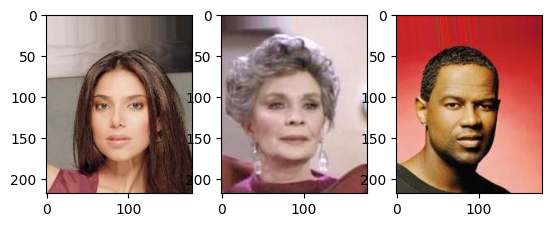

In [4]:
import matplotlib.pyplot as plt

plt.subplot(131)
plt.imshow(plt.imread('celeba/celeba/img_align_celeba/100019.jpg'))
plt.subplot(132)
plt.imshow(plt.imread('celeba/celeba/img_align_celeba/000084.jpg'))
plt.subplot(133)
plt.imshow(plt.imread('celeba/celeba/img_align_celeba/148483.jpg'))

In [1]:
import torch
import torchvision
from VanillaVAE import VanillaVAE, vae_loss
from VQVAE import VQVAE, vqvae_loss
from LVAE import LVAE, lvae_loss
from itertools import islice
import matplotlib.pyplot as plt


In [2]:
class CropCelebA64:
    def __call__(self, img):
        return img.crop((15, 40, 178 - 15, 218 - 30))

    def __repr__(self):
        return self.__class__.__name__ + '()'

In [3]:
train_dataset = torchvision.datasets.CelebA(
    root='celeba',
    split='train',
    transform=torchvision.transforms.Compose([
        CropCelebA64(),
        torchvision.transforms.Resize(64),
        torchvision.transforms.RandomHorizontalFlip(),
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Grayscale()
    ]),
)

test_dataset = torchvision.datasets.CelebA(
    root='celeba',
    split='valid',
    transform=torchvision.transforms.Compose([
        CropCelebA64(),
        torchvision.transforms.Resize(64),
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Grayscale()
    ])
)

In [4]:
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=4)
val_loader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=4)

# Vanilla VAE

In [17]:
input_dim = int(64 * 64)
hidden_dim = 784
latent_dim = 100
lr = 1e-3
epochs = 10
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = VanillaVAE(in_dim=input_dim, hidden_dim=hidden_dim, latent_dim=latent_dim).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

In [18]:
for epoch in range(epochs):
    total_loss = 0
    for images, _ in train_loader:
        images = images.view(-1, input_dim).to(device)
        recon_images, mu, logvar = model(images)
        loss = vae_loss(recon_images, images, mu, logvar)
        total_loss += loss.item()
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    avg_loss = total_loss / len(train_loader)
    print(f"INFO: Epoch {epoch + 1} | Loss: {avg_loss}")

INFO: Epoch 1 | Loss: 153818.29418945312
INFO: Epoch 2 | Loss: 149806.21661108246
INFO: Epoch 3 | Loss: 148946.33916814072
INFO: Epoch 4 | Loss: 148610.75191780907
INFO: Epoch 5 | Loss: 148275.3172200521
INFO: Epoch 6 | Loss: 147991.01911052968
INFO: Epoch 7 | Loss: 147822.5637606255
INFO: Epoch 8 | Loss: 147717.2133681579
INFO: Epoch 9 | Loss: 147626.52477489927
INFO: Epoch 10 | Loss: 147553.21582338345


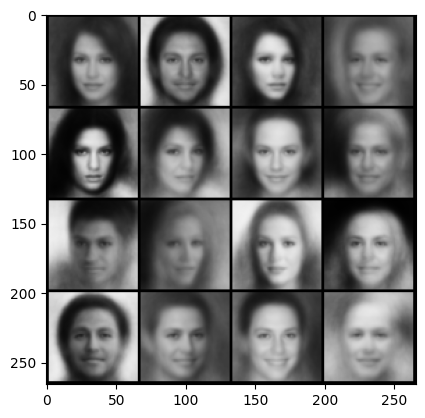

In [22]:
images, _ = list(islice(val_loader, 1))[0]
recon_images, _, _ = model(images.view(-1, input_dim).to(device))
reconstruction = recon_images[:16].cpu().clamp(0, 1).view(-1, 1, 64, 64)
plt.imshow(torchvision.utils.make_grid(reconstruction, nrow=4).permute(1, 2, 0))

# Beta VAE

In [17]:
input_dim = int(64 * 64)
hidden_dim = 784
latent_dim = 100
lr = 1e-3
epochs = 10
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = VanillaVAE(in_dim=input_dim, hidden_dim=hidden_dim, latent_dim=latent_dim).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

In [18]:
for epoch in range(epochs):
    total_loss = 0
    for images, _ in train_loader:
        images = images.view(-1, input_dim).to(device)
        recon_images, mu, logvar = model(images)
        loss = vae_loss(recon_images, images, mu, logvar, beta=10.0) / images.size(0)
        total_loss += loss.item()
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    avg_loss = total_loss / len(train_loader)
    print(f"INFO: Epoch {epoch + 1} | Loss: {avg_loss}")

INFO: Epoch 1 | Loss: 2521.1334320644164
INFO: Epoch 2 | Loss: 2467.3087626523193
INFO: Epoch 3 | Loss: 2463.0708727566703
INFO: Epoch 4 | Loss: 2461.1293559524247
INFO: Epoch 5 | Loss: 2460.2521068644974
INFO: Epoch 6 | Loss: 2459.551528450828
INFO: Epoch 7 | Loss: 2458.0437195975824
INFO: Epoch 8 | Loss: 2457.3580029565583
INFO: Epoch 9 | Loss: 2456.9470369350984
INFO: Epoch 10 | Loss: 2456.563264570896


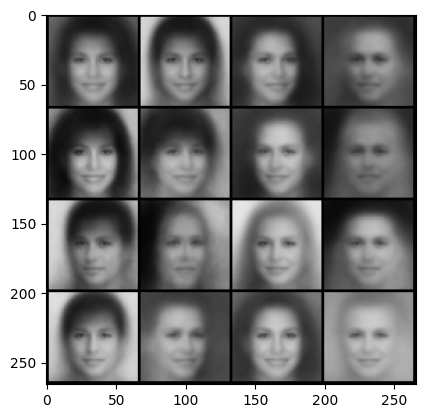

In [19]:
images, _ = list(islice(val_loader, 1))[0]
recon_images, _, _ = model(images.view(-1, input_dim).to(device))
reconstruction = recon_images[:16].cpu().clamp(0, 1).view(-1, 1, 64, 64)
plt.imshow(torchvision.utils.make_grid(reconstruction, nrow=4).permute(1, 2, 0))

# VQVAE

In [5]:
input_dim = 1
hidden_dim = 784
embedding_dim = 512
lr = 1e-3
epochs = 10
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = VQVAE(in_dim=input_dim, hidden_dim=hidden_dim, embedding_dim=embedding_dim, num_embeddings=100).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

In [6]:
for epoch in range(epochs):
    total_loss = 0
    for images, _ in train_loader:
        images = images.to(device)
        recon_images, loss = model(images)
        loss = vqvae_loss(recon_images, images, vq_loss=loss)
        total_loss += loss.item()
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    avg_loss = total_loss / len(train_loader)
    print(f"INFO: Epoch {epoch + 1} | Loss: {avg_loss}")

INFO: Epoch 1 | Loss: 1.8383832641601938
INFO: Epoch 2 | Loss: 0.9031666088497864
INFO: Epoch 3 | Loss: 0.5374861737748362
INFO: Epoch 4 | Loss: 0.5375647753851969
INFO: Epoch 5 | Loss: 0.5373398259094676
INFO: Epoch 6 | Loss: 0.5375388467086936
INFO: Epoch 7 | Loss: 0.5373425969631417
INFO: Epoch 8 | Loss: 0.5367583497163823
INFO: Epoch 9 | Loss: 0.5361212534630824
INFO: Epoch 10 | Loss: 0.5368429078667794


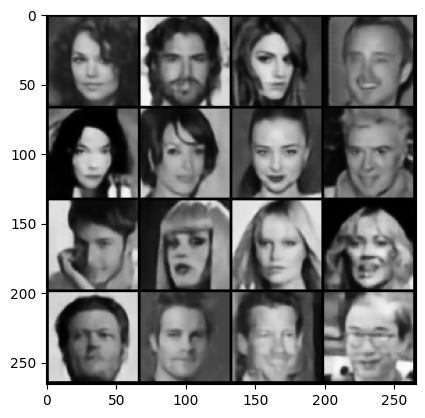

In [10]:
images, _ = list(islice(val_loader, 1))[0]
recon_images, _, = model(images.to(device))
reconstruction = recon_images[:16].cpu().clamp(0, 1).view(-1, 1, 64, 64)
plt.imshow(torchvision.utils.make_grid(reconstruction, nrow=4).permute(1, 2, 0))

# LVAE

In [5]:
input_dim = int(64 * 64)
hidden_dims = [1024, 512, 256]
latent_dims = [100, 80, 60]
lr = 1e-3
epochs = 10
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = LVAE(input_dim=input_dim, hidden_dims=hidden_dims, latent_dims=latent_dims).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

In [6]:
for epoch in range(epochs):
    total_loss = 0
    for images, _ in train_loader:
        images = images.view(-1, input_dim).to(device)
        recon_images, encoder_stats, z_list = model(images)
        loss = lvae_loss(images, recon_images, encoder_stats, z_list)
        total_loss += loss.item()
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    avg_loss = total_loss / len(train_loader)
    print(f"INFO: Epoch {epoch + 1} | Loss: {avg_loss}")

INFO: Epoch 1 | Loss: 8023.806266784668
INFO: Epoch 2 | Loss: 5641.095244785525
INFO: Epoch 3 | Loss: 5519.680354280292
INFO: Epoch 4 | Loss: 5460.899886221256
INFO: Epoch 5 | Loss: 5430.697970408313
INFO: Epoch 6 | Loss: 5411.364183629834
INFO: Epoch 7 | Loss: 5393.613278658885
INFO: Epoch 8 | Loss: 5381.924754112772
INFO: Epoch 9 | Loss: 5371.375927571231
INFO: Epoch 10 | Loss: 5363.907978849591


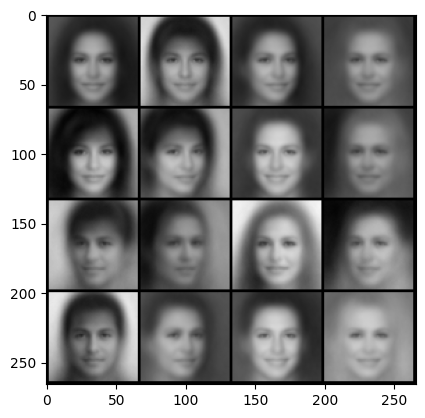

In [7]:
images, _ = list(islice(val_loader, 1))[0]
recon_images, _, _ = model(images.view(-1, input_dim).to(device))
reconstruction = recon_images[:16].cpu().clamp(0, 1).view(-1, 1, 64, 64)
plt.imshow(torchvision.utils.make_grid(reconstruction, nrow=4).permute(1, 2, 0))